**Disclaimer**: InStore Net Promoted Score is a Binary Classification project, based on this [Kaggle Competition](https://www.kaggle.com/competitions/instyle-nps). The context, company and business problem are ficticial.

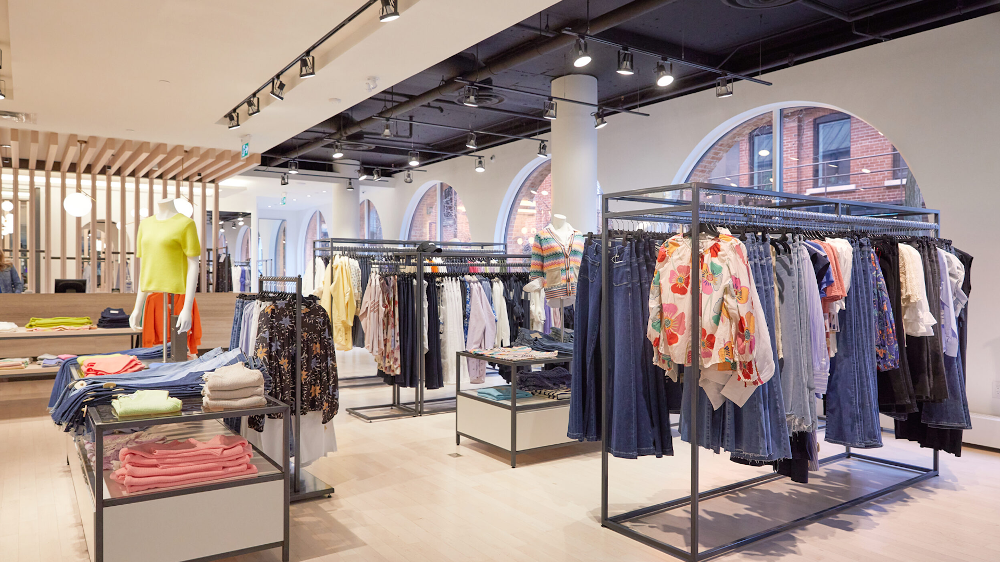

In [2]:
Image('C:/Users/perot/Documents/ds_repos/projects/InStyle_Net_Promoter_Score/reports/figures/wallpaper.png')

# 1. Business Scenario

## 1.1 - InStyle and their Business Problem
<p style="text-align: justify"> InStyle is one of the largest clothing stores in the United States facing customer experience issues.

The major challenge in scaling a store's revenue is to maintain product quality and high customer satisfaction rates.

As the company reaches more customers, internal sales processes starting from product conception, going through marketing promotion, and reaching financial payment systems begin to encounter issues.

The product team struggles to determine the majority of customers' needs. The marketing team faces challenges in identifying the ideal customer, and the development team grapples with high volumes of website and app traffic, leading to system crashes and rendering the site inoperable for hours. This, in turn, generates numerous complaints in customer service, led by the customer experience team.

Therefore, measuring customer satisfaction is extremely important for the company to maintain a good reputation in the market.

An interdisciplinary team called the "War Room," composed of professionals from Product, Marketing, Design, Data, and Development, was assembled to ensure an excellent customer shopping experience and a high satisfaction rate, even with the rapid growth in sales volume.

One of the War Room's first emergency actions was to provide personal assistance to customers. However, the initial challenge was to identify which customers had a "Satisfied" or "Neutral/Unsatisfied" satisfaction level, so the team could contact only the "Neutral/Unsatisfied" customers.

The Data Scientists of the War Room were tasked with training an algorithm to classify customers from a spreadsheet as "Satisfied" or "Neutral/Unsatisfied," predicting which customers might become Unsatisfied and, therefore, taking swift action to understand the reason for dissatisfaction and reverse the customer's situation. </p>

# 2. Solution Strategy

<p style="text-align: justify"> The solution follows the CRISP-DM (Cross-Industry Standard Process for Data Mining), which is a cyclic method of development. At the end of the first cycle, the team will have a first version end-to-end of this solution, allowing them to achieve good results faster, identify and address potential problems effectively. </p>

In [3]:
Image('C:/Users/perot/Documents/ds_repos/projects/InStyle_Net_Promoter_Score/reports/figures/crispds.jpg')

### **Business Problem and Business Understanding:** 
<p> It is essential to fully understand the business problem being addressed. This involves engaging in conversations with stakeholders to gain a clear insight into the challenges and goals. Establish measurable objectives. Ensure that the proposed solution is aligned with the broader goals of the organization. Identify the target audience of the solution and understand their needs and expectations. This includes assessing the technical feasibility of the proposed solution. Ensure that all relevant information about the business problem is documented clearly and accessible to the entire team involved in the project. Maintain open and ongoing communication with stakeholders throughout the process. </p>

### **Data Extraction and Data Cleaning:**
<p>
Collecting, uploading, accessing the data to be used to solve the business questions. And runing an initial check on the datas to identify:

* Number of Rows
* Number of Columns
* Data Types
* NaN Values
* Statistic Analysis (Central tendency, dispersion, etc.) 

</p>

### **Exploratory Data Analysis:** 
<p>On this phase tree types of analysis are made:

* **Univariate Analysis:** To understand the distribution of each feature, if there are outliers, if it is a normal distribution, etc.
* **Bivariate Analysis:** Where some business hyphotesis are made and validate
* **Multivariate Analysis:** Correlation analysis among all features.
</p>


### **Data Modeling and Feature Engineering:**
<p>
Feature engineering consists in derivate/modify (new) features from the existing ones, aiming to find something that can help to better explain the phenomenon of study.

Modeling consists in work with the datas aiming to adjust them according the machine learning principles. Below, are some exemples about what are done in this phase:

* Handling with missing values (NaN): fill, remove, filter, etc.
* Encoding: change from categorical to numerical
* Scaling and Normalization: ensure the numerical variables are on a similar scale.
* Dimensionality Reduction: Applying techniques like Principal Component Analysis (PCA) to reduce the number of features while preserving as much information as possible.
* Feature Engineering: Iteratively selecting and refining features based on their importance or relevance to the problem.

</p>


### **Machine Learning Modelling:**
<p>
Model Selection: Choose appropriate machine learning algorithms based on the nature of the problem and data.
Training and Evaluation: Train models on the training set and evaluate their performance using the testing set.
Hyperparameter Tuning: Fine-tune model hyperparameters to optimize performance. This involves adjusting parameters that are not learned from the training data, such as learning rates or regularization terms.
</p>

### **Evaluation**
<p>
The evaluation phase involves analyzing the performance of the machine learning model to determine whether it meets the established criteria and is satisfactory for further advancement in the project. During this step, the chosen performance metrics are compared with the actual process or results.

### **Deployment** 
Publish the model in a cloud environment so that other people or services can use the results to improve and make business decisions.


# 3. **BUSINESS PROBLEM RESOLUTION**

## 0 - LIBRARIES AND HELPER FUNCTIONS

### 0.1 - LIBRARIES

**Loading the libraries to be used on the project**

In [1]:
# Data Analysis and Data Manipulation Libraries
import inflection
import joblib
import pandas                                       as pd
import numpy                                        as np
import seaborn                                      as sns
import scikitplot                                   as skplt
import plotly.express                               as px
import plotly.graph_objects                         as go
from matplotlib              import pyplot          as plt

# Data Processing
from sklearn                 import model_selection as ms
from sklearn                 import preprocessing   as pp
from sklearn.model_selection import KFold

import optuna

# ML Models and Metrics
import lightgbm                                     as lgbm
from sklearn                 import ensemble        as en
from xgboost                 import XGBClassifier
from sklearn.linear_model    import LogisticRegression

from sklearn.metrics         import precision_score 
from sklearn.metrics         import precision_recall_curve
from sklearn.metrics         import confusion_matrix, ConfusionMatrixDisplay

# Dysplay
from IPython.core.display    import HTML
from IPython.display         import Image

import warnings
warnings.filterwarnings( 'ignore' )

### 0.2 - HELPER FUNCTIONS

**Personalized functions created to optimize the project**

In [4]:
# Function to help to indentify the best value for each parameter at time
def plot_scores(param_name, param_range, fixed_params, model, model_name, X_train, y_train, X_val, y_val):
    
    train_scores = []
    val_scores = []
    
    for param_value in param_range:
        params = fixed_params
        params[param_name] = param_value
        
        lgbm = model(**params)
        lgbm.fit(X_train, y_train)
        
        train_scores.append(precision_score(y_train, lgbm.predict(X_train)))
        val_scores.append(precision_score(y_val, lgbm.predict(X_val)))
    
    plt.figure(figsize=(8, 4))
    plt.plot(param_range, train_scores, label="Train", color="#264653", marker='o')
    plt.plot(param_range, val_scores, label="Val", color="#e76f51", marker='o')

    plt.title(model_name)
    plt.xlabel(param_name)
    plt.ylabel("Precision")
    plt.tight_layout()
    plt.legend(loc="best");

def cross_validation(kfold, modelName, model, X, y):
    
    # Number of folds
    fold=ms.StratifiedKFold(n_splits = kfold, shuffle=True, random_state=42)
    
    # Performance variables
    precision_list = []
    
    for train_cv,val_cv in fold.split(X, y):
        
        # Separating train and validation dataset for each kfold
        # training data
        x_train_fold = X.iloc[train_cv]
        x_train_fold = x_train_fold
        
        y_train_fold = y.iloc[train_cv]
        y_train_fold = y_train_fold
        
        # validation data
        x_val_fold = X.iloc[val_cv]
        x_val_fold = x_val_fold
        
        y_val_fold = y.iloc[val_cv]
        y_val_fold = y_val_fold
        
        # fitting the model
        model_fitted = model.fit(x_train_fold, y_train_fold)
        
        # predict
        yhat = model_fitted.predict(x_val_fold)
        
        #performance
        precision = precision_score(y_val_fold, yhat, average='micro')
        precision_list.append(precision)
        
    return np.mean(precision_list)

def jupyter_settings():
    %matplotlib inline
   
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [18, 8]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container {width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()

In [5]:
jupyter_settings()

## 1 - DATA EXTRACTION

**Loading the data**

In [6]:
# All Data - Windows
df_raw = pd.read_csv('C:/Users/perot/Documents/ds_repos/projects/InStyle_Net_Promoter_Score/data/train.csv')

In [7]:
## Renaming Columns
cols_old = ['id', 'Gender', 'Customer Type', 'Age', 'Type of Purchase','Store size', 'Store distance', 'InStore wifi',
            'Open/Close time convenient', 'Easy of online shopping', 'Store location', 'Toilet cleaning', 'Dressing room', 
            'Waiting room','Kids entertainment', 'Seller service', 'Showroom ', 'Self-Store', 'Purchase service', 
            'Store Service', 'Cleanliness', 'Carrier delay in minutes', 'Delivery delay in minutes', 'Satisfaction']

snakecase = lambda x: inflection.underscore(x.replace(' ', '_'))
cols_new = list( map( snakecase, cols_old ) )

df_raw.columns = cols_new

In [8]:
df1 = df_raw.copy()

### 1.1 - Data Descriptive

In [ ]:
#prof = ProfileReport(df_raw)
#prof.to_file(output_file='data_descriptive.html')

**Size of dataset**

In [9]:
# Data Dimensions
print( 'Number of Rows: {}'.format( df1.shape[0] ) )
print( 'Number of Cols: {}'.format( df1.shape[1] ) )

Number of Rows: 103904
Number of Cols: 24


**Data types**

In [11]:
df1.head()

,id,gender,customer_type,age,type_of_purchase,store_size,store_distance,in_store_wifi,open/close_time_convenient,easy_of_online_shopping,store_location,toilet_cleaning,dressing_room,waiting_room,kids_entertainment,seller_service,showroom_,self_store,purchase_service,store_service,cleanliness,carrier_delay_in_minutes,delivery_delay_in_minutes,satisfaction
0,70172,Male,Loyal Customer,13,Personal,Small,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,Neutral or Dissatisfaction
1,5047,Male,disloyal Customer,25,Gift,Large,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,Neutral or Dissatisfaction
2,110028,Female,Loyal Customer,26,Gift,Large,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,Satisfied
3,24026,Female,Loyal Customer,25,Gift,Large,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,Neutral or Dissatisfaction
4,119299,Male,Loyal Customer,61,Gift,Large,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,Satisfied


In [10]:
# Data Types
df1.dtypes

id                              int64
gender                         object
customer_type                  object
age                             int64
type_of_purchase               object
store_size                     object
store_distance                  int64
in_store_wifi                   int64
open/close_time_convenient      int64
easy_of_online_shopping         int64
store_location                  int64
toilet_cleaning                 int64
dressing_room                   int64
waiting_room                    int64
kids_entertainment              int64
seller_service                  int64
showroom_                       int64
self_store                      int64
purchase_service                int64
store_service                   int64
cleanliness                     int64
carrier_delay_in_minutes        int64
delivery_delay_in_minutes     float64
satisfaction                   object
dtype: object

**Check NaN Values**

In [12]:
# Verifying if there are NaN values
df1.isna().sum()

id                              0
gender                          0
customer_type                   0
age                             0
type_of_purchase                0
store_size                      0
store_distance                  0
in_store_wifi                   0
open/close_time_convenient      0
easy_of_online_shopping         0
store_location                  0
toilet_cleaning                 0
dressing_room                   0
waiting_room                    0
kids_entertainment              0
seller_service                  0
showroom_                       0
self_store                      0
purchase_service                0
store_service                   0
cleanliness                     0
carrier_delay_in_minutes        0
delivery_delay_in_minutes     310
satisfaction                    0
dtype: int64

**There are 310 missing values for the variable delivery_delay_in_minutes.**

<p>
The decision made is to fill the NaN values with the correspondent value on the column carrier_delay_in_minutes, because were noticed that when the carrier is 0, the delay is also 0, and around 50% of the NaN is 0 for carrier_delay_in_minutes.
</p>

In [13]:
# Analyze and Fill NaN
df1['delivery_delay_in_minutes'] = df1['delivery_delay_in_minutes'].fillna(df1['carrier_delay_in_minutes'])

### 1.1.1 - Statistical Distribution Analysis

In [14]:
# numerical features
num_attributes = df1.select_dtypes(include=['int64', 'float64'])

# categorical features
cat_attributes = df1.select_dtypes(exclude=['int64', 'float64'])

In [15]:
# Central Tendency - mean, median
ct1 = pd.DataFrame( num_attributes.apply( np.mean ) ).T
ct2 = pd.DataFrame( num_attributes.apply( np.median ) ).T

# Dispersion - std, min, max, range, skew, kurtosis
d1 = pd.DataFrame( num_attributes.apply( np.std ) ).T
d2 = pd.DataFrame( num_attributes.apply( min ) ).T
d3 = pd.DataFrame( num_attributes.apply( max ) ).T
d4 = pd.DataFrame( num_attributes.apply( lambda x: x.max() - x.min() ) ).T
d5 = pd.DataFrame( num_attributes.apply( lambda x: x.skew() ) ).T
d6 = pd.DataFrame( num_attributes.apply( lambda x: x.kurtosis() ) ).T

# Concatenar
m = pd.concat( [ d2, d3, d4, ct1, ct2, d1, d5, d6 ] ).T.reset_index()
m.columns = ['attributes', 'min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis']
m

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,id,1.0,129880.0,129879.0,64924.210502,64856.5,37463.631970,0.002864,-1.198440
1,age,7.0,85.0,78.0,39.379706,40.0,15.114891,-0.004516,-0.719568
2,store_distance,31.0,4983.0,4952.0,1189.448375,843.0,997.142482,1.109466,0.268535
3,in_store_wifi,0.0,5.0,5.0,2.729683,3.0,1.327823,0.040408,-0.846170
4,open/close_time_convenient,0.0,5.0,5.0,3.060296,3.0,1.525068,-0.334399,-1.037767
5,easy_of_online_shopping,0.0,5.0,5.0,2.756901,3.0,1.398923,-0.018294,-0.910346
6,store_location,0.0,5.0,5.0,2.976883,3.0,1.277615,-0.058889,-1.030283
7,toilet_cleaning,0.0,5.0,5.0,3.202129,3.0,1.329526,-0.151279,-1.145453
8,dressing_room,0.0,5.0,5.0,3.250375,3.0,1.349502,-0.453852,-0.702006
9,waiting_room,0.0,5.0,5.0,3.439396,4.0,1.319081,-0.482775,-0.925702


In [47]:
num_attributes.columns

Index(['id', 'age', 'store_distance', 'in_store_wifi',
       'open/close_time_convenient', 'easy_of_online_shopping',
       'store_location', 'toilet_cleaning', 'dressing_room', 'waiting_room',
       'kids_entertainment', 'seller_service', 'showroom_', 'self_store',
       'purchase_service', 'store_service', 'cleanliness',
       'carrier_delay_in_minutes', 'delivery_delay_in_minutes'],
      dtype='object')

### Summary:

Our dataset contains 103904 rows and 24 columns;

The data types seems to be okay;

There are 310 missing data points for delivery_delay_in_minutes, which indicates whether the delivery was on time or not. I assumed that this column is correlated with carrier_delay_in_minutes, and after some analysis, I found that when carrier_delay_in_minutes is equal to 0, delivery_delay_in_minutes is also 0. Approximately 50% of the missing data in the delivery_delay_in_minutes column correspond to a value of 0 for carrier_delay_in_minutes. Therefore, I have decided to fill the NaN values with the corresponding values from the carrier_delay_in_minutes column.

#### Features

**id**: Is the number that identify the customer;

**age**: The younger customer is 7 years old meanwhile the oldest one is 85 years old. The median and mean are closer, what indicates there are no outliers. However the standard deviation is a bit higher. What suggests that the data are a bit far from the mean and are scattered. A small value for skew suggests that the data distribution is simetrics. And the kurtosis suggests the distribuition has a lower peak and lighter tails, indicating a lower probability of extreme values.

**store_distance**: Represents the distance from the store to the city centre. The values on this variable looks like alright. The mean and median are bit far, what indicates that some shops are far from the city centre (because the mean is higher than the median). The standard deviation is higher, what indicates that the shop distance are scattered and most of the data migh are concentrate on the first quartile. A higher value for the skew suggests that the data distribution is not simetrics.

**in_store_wifi**: It is a score gave for each custormer to the shop, in relation to the quality of the wify.

**open/close_time_convenient**:

**easy_of_online_shopping**:

**store_location**:

**toilet_cleaning**:

**dressing_room**:

**waiting_room**:

**kids_entertainment**:

**seller_service**:

**showroom**:

**self_store**:

**purchase_service**:

**store_service**:

**cleanliness**:

**carrier_delay_in_minutes**:

**delivery_delay_in_minutes**:

## 2 - FEATURE ENGINEERING

**On this step, I have created the features below:**
    
* **distance**: 
  - *close*: where the value is lower than 2500;
  - *far*: where the value is higher than 2500;
  
    
* **age_group**:
    - *young*: where the age is lower than 18;
    - *adult*: where the age are between 18 and 60;
    - *elderly*: where the age is higher than 60;

In [22]:
df2 = df1.copy()

In [23]:
# New Features

df2['distance'] = df2['store_distance'].apply(lambda x: 'close' if x <= 2500 else 
                                                         'far' )



df2['age_group'] = df2['age'].apply(lambda x: 'young' if x <= 18 else
                                              'adult' if ((x > 18) and (x <= 60)) else
                                              'elderly')

## 3. DATA FILTERING

In [24]:
df3 = df2.copy()

## 4. EDA

In [25]:
df4_eda = df3.copy()

### 4.1 Univariate Analysis

###### Numerical Attributes

Boxplot for each numerical attributes

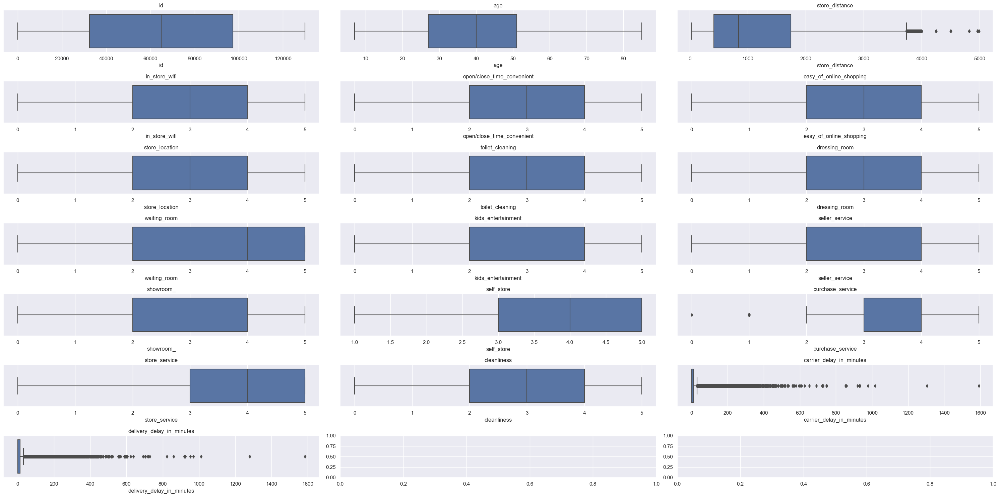

In [26]:
columns_to_plot = num_attributes.columns

fig, axes = plt.subplots(nrows=7, ncols=3, figsize=(30, 15))
fig.subplots_adjust(hspace=0.5)

#Usar o divmod para encontrar os axes 
for i, column in enumerate(columns_to_plot):
    row, col = divmod(i, 3)
    ax = axes[row, col]
    #plotar todos os boxplots
    sns.boxplot(df1, x=column, ax=ax)
    ax.set_title(column)

plt.tight_layout()
plt.show()

###### Categorical Attributes

Bar plot comparing the distribuition for all categorical variables in relation to the variable response

In [39]:
labels = cat_attributes.columns
label = 'satisfaction'

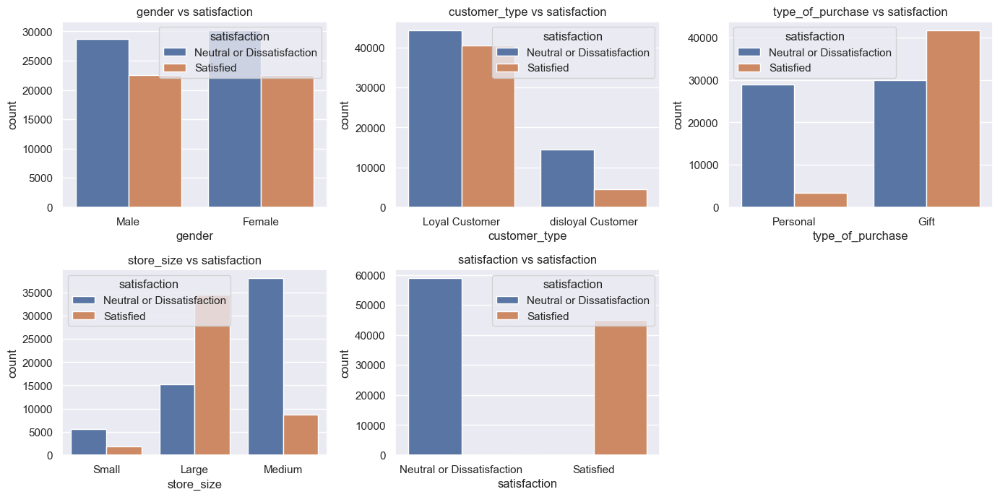

In [40]:
plt.figure(figsize=(14, len(labels) * 2))
for i, col in enumerate(labels):
    plt.subplot(len(labels) // 2 + 1, 3, i + 1)
    sns.countplot(x=col, hue=label, data=df1)
    plt.title(f"{col} vs {label}")
    plt.tight_layout()

### 4.2 Bivariate Analysis

1. As the dressing room score increases, the volume of dissatisfied customers decreases.
<p>  
    
    **Hyphotesis is true.**
</p>

In [41]:
aux = df4_eda[['id','dressing_room','satisfaction']].groupby(['dressing_room','satisfaction']).count().reset_index()
fig = px.bar(aux, x="dressing_room", y="id",
             color='satisfaction',
             barmode='group',
             text='id',
             color_discrete_sequence=['mediumturquoise', 'lightgreen'],
             height=600,
             width=1000)

fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition='outside')

fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Dressing Room Score vs Customer Satisfaction', 'x':0.45, 'y':0.95},
                  plot_bgcolor='white',
                  paper_bgcolor='white')

fig.show()

2. As the toilet cleaning score increases, the volume of dissatisfied customers decreases.
<p>
    
    **Hyphotesis is True.**
</p>

In [42]:
aux = df4_eda[['id','toilet_cleaning','satisfaction']].groupby(['toilet_cleaning','satisfaction']).count().reset_index()
fig = px.bar(aux, x="toilet_cleaning", y="id",
             color='satisfaction',
             barmode='group',
             text='id',
             color_discrete_sequence=['mediumturquoise', 'lightgreen'],
             height=600,
             width=1000)

fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition='outside')

fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Toilet Cleaning Score vs Customer Satisfaction', 'x':0.45, 'y':0.95},
                  plot_bgcolor='white',
                  paper_bgcolor='white')

fig.show()

3. Male customers are generally more satisfied than female customers.
<p>
    
    **Hyphotesis is False.**
</p>

In [43]:
aux2 = pd.crosstab(df4_eda['gender'], df4_eda['satisfaction'])
aux2['percentage'] = aux2['Neutral or Dissatisfaction']/(aux2['Neutral or Dissatisfaction']+aux2['Satisfied'])

colors = ['mediumturquoise', 'lightgreen']

fig = go.Figure(data=[go.Pie(labels= ['Female', 'Male'], values= [57, 56])])

fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))


fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Percent. of Gender vs Customer Satisfaction', 'x':0.50, 'y':0.95},
                  height=600,  # Adjust the height as needed
                  width=1000    # Adjust the width as needed
                  )
fig.show()

4. The larger the store, the more satisfied its customers tend to be.
<p>
    
    **Hyphotesis is True.**
</p>

In [44]:
aux1 = df4_eda[['id','store_size','satisfaction']].groupby(['store_size','satisfaction']).count().reset_index()

fig = px.bar(aux1, x="store_size", y="id",
             color='satisfaction',
             barmode='group',
             text='id',
             color_discrete_sequence=['mediumturquoise', 'lightgreen'],
             height=600,
             width=1000)

fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition='outside')

fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Store Size vs Customer Satisfaction', 'x':0.35, 'y':0.95},
                  plot_bgcolor='white',
                  paper_bgcolor='white')

fig.show()

5. Even unsatisfied customers are happy with the store service.
<p>
    
    **Hyphotesis is True.**
</p>

In [45]:
aux =df4_eda[['id','store_service','satisfaction']].groupby(['store_service','satisfaction']).count().reset_index()

fig = px.bar(aux, x="store_service", y="id",
             color='satisfaction',
             barmode='group',
             text='id',
             color_discrete_sequence=['mediumturquoise', 'lightgreen'],
             height=600,
             width=1000)

fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition='outside')

fig.update_layout(uniformtext_minsize=8, 
                  uniformtext_mode='hide',
                  title={ 'text':'Store Service Score vs Customer Satisfaction', 'x':0.50, 'y':0.95},
                  plot_bgcolor='white',
                  paper_bgcolor='white')

fig.show()


### 4.3 Multivariate Analysis

###### Numerical Variables

Correlation matrix between the numerical variables

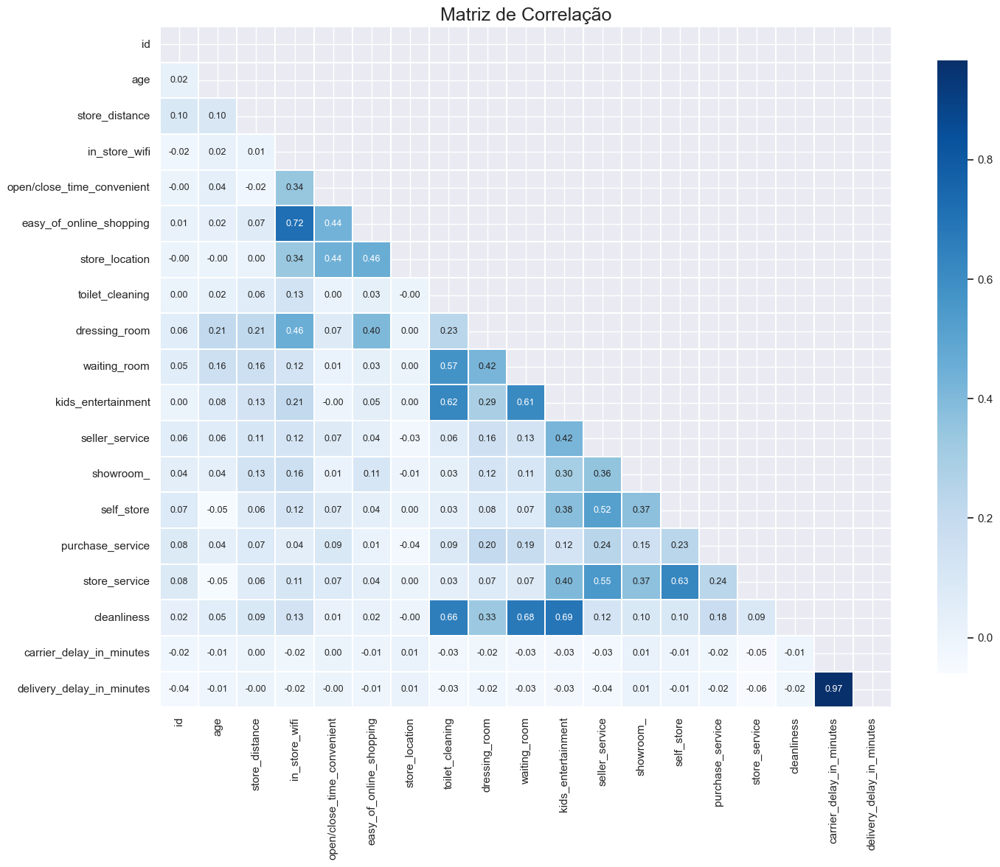

In [46]:
aux = num_attributes.copy()

mask = np.zeros_like(aux.corr(), dtype=bool) 
mask[np.triu_indices_from(mask)] = True 

f, ax = plt.subplots(figsize=(16, 12))

plt.title('Matriz de Correlação',fontsize=18)
sns.heatmap(aux.corr(),linewidths=0.25,fmt=".2f", cmap="Blues", linecolor='w',annot=True,annot_kws={"size":9},mask=mask,cbar_kws={"shrink": .9});

## 5. DATA PREPARATION

In [ ]:
df5 = df4_eda.copy()

<p style="text-align: justify"> In this phase, I have worked on feature engineering, encoding, and rescaling techniques.

On feature engineering, we created two new features:
* **distance:** Classify as 'close' those instances where the 'store_distance' value is lower than 2500, and as 'far' those instances where the 'store_distance' value is higher.
* **age group :** Assign the label "young" if the age is lower than 18, "adult" if it is higher than or equal to 18 and lower than 60, and "elderly" if the age is 60 or higher.

On encoding and rescaling, we worked with:

* **frequency encoding:** Change categorical values to numerical values based on their frequency of occurrence.
* **ordinal encoding:** Change categorical values to numerical values, taking into consideration the importance of each value.
* **Min Max Scaler:** Rescaling the numerical features is applied to features that do not follow a normal distribution.
* **Robust Scaler:** Rescaling the numerical features is applied to features that follow a normal distribution and contain outliers.
</p>

In [ ]:
# FREQUENCY ENCODER
# gender
fe_gender = df5.groupby('gender').size() / len(df5)
df5['gender'] = df5['gender'].map( fe_gender )
#joblib.dump(fe_gender, 'fe_gender.joblib')

# type_of_purchase
fe_tpurchase = df5.groupby( 'type_of_purchase' ).size() / len( df5 ) 
df5['type_of_purchase'] = df5['type_of_purchase'].map( fe_tpurchase )
#joblib.dump(fe_tpurchase, 'fe_tpurchase.joblib')

# ORDINAL ENCODER
oea = pp.OrdinalEncoder()
oeb = pp.OrdinalEncoder()
oec = pp.OrdinalEncoder()
oed = pp.OrdinalEncoder()

# distance
df5['distance'] = oea.fit_transform(df5[['distance']].values)
#joblib.dump(oea, 'oe_distance.joblib')

# age_group
df5['age_group'] = oeb.fit_transform(df5[['age_group']].values)
#joblib.dump(oeb, 'oe_ageg.joblib')

# customer_type
df5['customer_type'] = oec.fit_transform(df5[['customer_type']].values)
#joblib.dump(oec, 'oec_customer.joblib')

# Store Size
df5['store_size'] = oed.fit_transform( df5[['store_size']].values )
#joblib.dump(oeb, 'oe_store_size.joblib')

# REESCALING
mms = pp.MinMaxScaler()

# age
df5['age'] = mms.fit_transform( df5[['age']].values )
#joblib.dump(mms, 'mms_age.joblib')

# ROBUST SCALER
rs = pp.RobustScaler()

# Store Distance
df5['store_distance'] = rs.fit_transform( df5[['store_distance']].values )
#joblib.dump(rs, 'rs_stored.joblib')

# TRANSFORMACAO LOGARITMICA 
# carrier_delay_in_minutes
df5['carrier_delay_in_minutes'] = df5['carrier_delay_in_minutes'].apply(lambda x: np.log(x) if x > 0 else x) 

# delivery_delay_in_minutes
df5['delivery_delay_in_minutes'] = df5['delivery_delay_in_minutes'].apply(lambda x: np.log(x) if x > 0 else x) 

# Response
# satisfaction
df5['satisfaction'] = df5['satisfaction'].apply(lambda x: 1 if x=='Satisfied' else 0)

### 5.1 - Train, test, validation split

Before to start with the algorithms, tree new datasets were created from the initial one:

* **train:** Containing aroun 70% of the total data and it will be used to train the algorithm.
* **validation:** Containing around 15% of the total data and it will be used to select the best parameters (fine tuning)
* **test:** Containing around 15% of the total data and it will be used to evaluate the selected model after tuning.

In [ ]:
X = df5.drop( ['satisfaction'], axis=1 )
y = df5['satisfaction'].copy()

train_x, val_x, train_y, val_y   = ms.train_test_split( X, y, test_size=0.15, shuffle=True, random_state = 0 )
train_x, test_x, train_y, test_y   = ms.train_test_split( train_x, train_y, test_size=0.15, shuffle=True, random_state = 0 )
print(f" train_x: {train_x.shape}\n train_y: {train_y.shape}\n val_x: {val_x.shape}\n val_y: {val_y.shape}\n test_x: {test_x.shape}\n test_y: {test_y.shape}\n")

## 6. FEATURE SELECTION

I am preparing to execute a machine learning algorithm aimed at identifying the most crucial features for optimal learning. In this process, I plan to leverage multiple tools, including the analysis of a feature importance chart, examination of the correlation matrix, and validation of hypotheses, to strategically determine which features to incorporate into the machine learning models.

The correlation matrix will guide me in identifying and potentially removing features that exhibit high correlation, ensuring that the chosen variables contribute unique information to the model. Simultaneously, the feature importance chart will assist in the selection of features that hold greater significance for the machine learning model, thereby enhancing its predictive capabilities.

In this initial cycle, I intend to include all available features. However, in subsequent cycles, I will critically evaluate the necessity of retaining each feature. This evaluation will focus on potential benefits such as reducing model complexity and size. By iteratively refining the feature set, I aim to enhance the efficiency and effectiveness of the machine learning model over time.

I am going to use the datasets below for feature selection:
- X: contains all features
- y: contains the variable response

In [ ]:
df6_x = X.copy()
df6_y = y.copy()

In [ ]:
# model definition
xgboost = XGBClassifier()

# model training
xgboost.fit(df6_x, df6_y)

In [ ]:
feature_importances = xgboost.feature_importances_
feature_names = df6_x.columns 
feature_importance_dict = dict(zip(feature_names, feature_importances))
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_importance_scores = zip(*sorted_feature_importance)
plt.figure(figsize=(10, 10))

plt.barh(sorted_feature_names, sorted_importance_scores)
plt.xlabel("Feature Importance")
plt.ylabel("Feature Name")
plt.title("Feature Importance")
plt.show()

## 7. MACHINE LEARNING

**The aim of the project is to identify Neutral or Dissatisfied Customers**

On this step, I will use the datasets as per below:
- X, y: to train and evaluate the machine learning models using cross validation technique;
- train_x, train_y: to train the machine learning models;
- val_x, val_y: to evaluate the trained machine learning models;
- test_x, test_y: to evaluate the machine learning model, after hyperparameteres fine tuning;


The algorithms will be evaluated calculating the micro-precision metric;
- Precision micro: represents the ratio of correct classifications for a positive class in relation to the total positive instances that the algorithm predicted.

### 7.2 Machine Learning Models

On this step, I am just runing the machine learning algorithm without any parameter tuning, just using the standard model to evaluate them and decide if they can be used on this project.

There are two informations to be considered on this phase:

* The metric itself
* The confusion matrix, see @fig_nine

The performance for the machine learning are as per below:

| ML Model                | Precision_micro cross_validation|Precision_micro Train, Val, Test Split |
|:------------------------|:--------------------------------|---------------------------------------|
| XGB                     | 0.9638                          |0.9632                                 |
| LGBM                    | 0.9650                          |0.9654                                 |
| Logistic Regression     | 0.5666                          |0.5671                                 |
| Randon Forest           | 0.9638                          |0.9640                                 |


#### 7.2.1 XGB

7.2.1.1 Performance using cross_validation technique

In [ ]:
clf_xgb = XGBClassifier()

evalxgb = cross_validation(5, 'XGB', clf_xgb, X, y)
evalxgb

7.2.1.2 Performance using train_test_val split technique

In [ ]:
# model training
clf_xgb.fit(train_x, train_y )

# model prediction - Check if the model perform well
yhat_xgb = clf_xgb.predict( val_x )

# performance
precision_score(val_y, yhat_xgb, average='micro')

In [ ]:
val_y.value_counts()

**Confusion Matrix for XGBoost Classifier:**

Analyzing the chart, it is possible to identify that the model classified correctly 8673 customers as Neutral/Dissatisfied and classified incorrectly 205 customers. In other words, the XGBoost Classifier was able to find 8673 dissatisfied customers in a universe of 8878 customers dissatisfied. Making 205 wrong predictions when analyzing the interested class Neutral / Dissatisfied Customers.

In [ ]:
#| label: fig_nine
#| fig-cap: "Figure 9: XGB Confusion Matrix"

cm_xgb = confusion_matrix(val_y, yhat_xgb,  labels = clf_xgb.classes_)
cm_xgb_disp = ConfusionMatrixDisplay(confusion_matrix = cm_xgb,
                                      display_labels = clf_xgb.classes_,
                                     )

cm_xgb_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

To analyze the chart above, consider:
- 0: Neutral or Dissatisfaction
- 1: Satisfied

#### 7.2.2 LGBM

7.2.2.1 Performance using cross_validation technique

In [ ]:
clf_lgbm = lgbm.LGBMClassifier(verbose=-1)

evallgbm = cross_validation(5, 'LGBM', clf_lgbm, X, y)
evallgbm

7.2.2.2 Performance using train_test_split technique

In [ ]:
# model training
clf_lgbm.fit( train_x, train_y )

# model prediction - Check if the model perform well
yhat_lgbm = clf_lgbm.predict( val_x )

# performance
precision_score(val_y, yhat_lgbm, average='micro')

**Confusion Matrix for LGBM Classifier:**

Analyzing the chart, it is possible to identify that the model classified correctly 8645 customers as Neutral/Dissatisfied and classified incorrectly 162 customers. In other words, the LGBM Classifier was able to find 8645 dissatisfied customers in a universe of 8807, making 195 wrong predictions when analyzing the interested class Neutral / Dissatisfied Customers.

In [ ]:
#| label: fig_ten
#| fig-cap: "Figure 10: LGBM Confusion Matrix"

cm_lgbm = confusion_matrix(val_y, yhat_lgbm,  labels = clf_lgbm.classes_)
cm_lgbm_disp = ConfusionMatrixDisplay(confusion_matrix = cm_lgbm,
                                      display_labels = clf_lgbm.classes_,
                                     )

cm_lgbm_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

#### 7.2.3 Logistic Regression

7.2.3.1 Performance using cross_validation technique

In [ ]:
clf_lr = LogisticRegression()

evallr = cross_validation(5, 'Logistic Regression', clf_lr, X, y)
evallr

7.2.3.2 Performance using train_test_split technique

In [ ]:
# Model Training
clf_lr.fit( train_x, train_y )

# Prediction
yhat_lr = clf_lr.predict(val_x)

# performance
precision_score(val_y, yhat_lr, average='micro')

**Confusion Matrix for Logistic Regression Classifier:**

Analyzing the chart, it is possible to identify that the model classified correctly 8645 customers as Neutral/Dissatisfied and classified incorrectly 162 customers. In other words, the LGBM Classifier was able to find 8645 dissatisfied customers in a universe of 8807, making 195 wrong predictions when analyzing the interested class Neutral / Dissatisfied Customers.

In [ ]:
#| fig-cap: "Figure 11: Logistic Regression Classifier Confusion Matrix"

cm_lr      = confusion_matrix(val_y, yhat_lr,  labels = clf_lr.classes_)
cm_lr_disp = ConfusionMatrixDisplay(confusion_matrix = cm_lr,
                                    display_labels = clf_lr.classes_,
                                     )

cm_lr_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

### 7.2.4 Randon Forest Classifier

7.2.4.1 Performance using cross_validation technique

In [ ]:
clf_rf = en.RandomForestClassifier()

evalrf = cross_validation(5, 'Randon Forest', clf_rf, X, y)
evalrf

7.2.4.2 Performance using train_test_split technique

In [ ]:
# Model Training
clf_rf.fit( train_x, train_y )

# Prediction
yhat_rf = clf_rf.predict(val_x)

# performance
precision_score(val_y, yhat_rf, average='micro')

**Confusion Matrix for Randon Forest Classifier:**

Analyzing the chart, it is possible to identify that the model classified correctly 8688 customers as Neutral/Dissatisfied and classified incorrectly 190 customers. In other words, the Randon Forest Classifier was able to find 8688 dissatisfied customers in a universe of 8878, where only 190 dissatisfied customers were not identified.

In [ ]:
#| fig-cap: "Figure 12: Randon Forest Confusion Matrix"

cm_rf      = confusion_matrix(val_y, yhat_rf,  labels = clf_rf.classes_)
cm_rf_disp = ConfusionMatrixDisplay(confusion_matrix = cm_rf,
                                    display_labels = clf_rf.classes_,
                                     )

cm_rf_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

## 8. FINE TUNING

To perform a fine tuning on this project, I have used a bysean search algorithm called Optuna and I have used it do set up some parameters, and also, I have tunned some parameters separatelly.

### 8.1 XGB

In [ ]:
# def objective_xgb(trial):
#     """Define the objective function"""

#     params = {
#         'max_depth': trial.suggest_int('max_depth', 5, 20),
#         'eta': trial.suggest_float('eta', 0.01, 0.05),
#         'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1.0),
#         'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
#         'min_child_weight': trial.suggest_int('min_child_weight', 1, 15),
#         'gamma': trial.suggest_loguniform('gamma', 1e-8, 1.0),
#         'subsample': trial.suggest_loguniform('subsample', 0.01, 1.0),
#         'colsample_bytree': trial.suggest_loguniform('colsample_bytree', 0.1, 1.0),
#         'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-8, 1.0),
#         'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-8, 1.0),
#         'eval_metric': 'mlogloss',
#         'use_label_encoder': False
#     }

#     # Fit the model
#     optuna_xgb = XGBClassifier(**params)
#     optuna_xgb.fit(x_train, y_train)

#     # Make predictions
#     optuna_xgb_pred = optuna_xgb.predict(test_x)

#     # Evaluate predictions
#     precision = precision_score(test_y, optuna_xgb_pred, average='micro')
#     return precision

In [ ]:
# %%time
# study_xgb = optuna.create_study(direction='maximize')
# study_xgb.optimize(objective_xgb, n_trials=150)

In [ ]:
# print('Number of finished trials: {}'.format(len(study_xgb.trials)))
# print('Best trial:')
# trial = study_xgb.best_trial

# print('  Value: {}'.format(trial.value))
# print('  Params: ')

# for key, value in trial.params.items():
#     print('    {}: {}'.format(key, value))

**These are the hyperparameteres values found through optuna:**
<p>

* max_depth: 12,
* eta: 0.019834339603301256,
* learning_rate: 0.011,
* n_estimators: 450,
* min_child_weight: 2,
* gamma: 0.3113641371820694,
* subsample: 0.7039764982894372,
* colsample_bytree: 0.6313892474468165,
* reg_alpha: 4.239283976142879e-06,
* reg_lambda: 7.270434099537632e-05
</p>

In [ ]:
params_xgb = {
    'max_depth': 12,
    'eta': 0.019834339603301256,
    'learning_rate': 0.011,
    'n_estimators': 450,
    'min_child_weight': 2,
    'gamma': 0.3113641371820694,
    'subsample': 0.7039764982894372,
    'colsample_bytree': 0.6313892474468165,
    'reg_alpha': 4.239283976142879e-06,
    'reg_lambda': 7.270434099537632e-05
}

In [ ]:
#| label: fig_eleven
#| fig-cap: "Figure 11: Lineplot Learning Rate vs Precision"

param_name = "learning_rate"
param_range = np.arange(0.0001, 0.03, 0.0005)
fixed_params = params_xgb.copy()

plot_scores(param_name, param_range, fixed_params, XGBClassifier,'XGBClassifier', train_x, train_y, val_x, val_y)

In [ ]:
param_name = "learning_rate"
param_range = np.arange(0.001, 0.03, 0.0005)
fixed_params = params_xgb.copy()

plot_scores(param_name, param_range, fixed_params, XGBClassifier,'XGBClassifier', train_x, train_y, val_x, val_y)

In [ ]:
params_xgb = {
    'max_depth': 12,
    'eta': 0.019834339603301256,
    'learning_rate': 0.0205,
    'n_estimators': 450,
    'min_child_weight': 2,
    'gamma': 0.3113641371820694,
    'subsample': 0.7039764982894372,
    'colsample_bytree': 0.6313892474468165,
    'reg_alpha': 4.239283976142879e-06,
    'reg_lambda': 7.270434099537632e-05
}

In [ ]:
#| label: fig_twelve
#| fig-cap: "Figure 12: N. Estimators vs Precision"

param_name = "n_estimators"
param_range = np.arange(100, 600, 100)
fixed_params = params_xgb.copy()

plot_scores(param_name, param_range, fixed_params, XGBClassifier,'XGBClassifier', train_x, train_y, val_x, val_y)

In [ ]:
params_xgb = {
    'max_depth': 12,
    'eta': 0.019834339603301256,
    'learning_rate': 0.0205,
    'n_estimators': 300,
    'min_child_weight': 2,
    'gamma': 0.3113641371820694,
    'subsample': 0.7039764982894372,
    'colsample_bytree': 0.6313892474468165,
    'reg_alpha': 4.239283976142879e-06,
    'reg_lambda': 7.270434099537632e-05
}

In [ ]:
#| label: fig_thirtheen
#| fig-cap: "Figure 13: N. Max Depth vs Precision "

param_name = "max_depth"
param_range = np.arange(2, 20, 1)
fixed_params = params_xgb.copy()

plot_scores(param_name, param_range, fixed_params, XGBClassifier,'XGBClassifier', train_x, train_y, val_x, val_y)

**The final parameters fox XGB are:**
<p>

* max_depth': 12,
* eta': 0.019834339603301256,
* learning_rate': 0.0205,
* n_estimators': 300,
* min_child_weight': 2,
* gamma': 0.3113641371820694,
* subsample': 0.7039764982894372,
* colsample_bytree': 0.6313892474468165,
* reg_alpha': 4.239283976142879e-06,
* reg_lambda': 7.270434099537632e-05
</p>

In [ ]:
# Final parameters to train XGB Classifier
params_xgb = {
    'max_depth': 12,
    'eta': 0.019834339603301256,
    'learning_rate': 0.0205,
    'n_estimators': 300,
    'min_child_weight': 2,
    'gamma': 0.3113641371820694,
    'subsample': 0.7039764982894372,
    'colsample_bytree': 0.6313892474468165,
    'reg_alpha': 4.239283976142879e-06,
    'reg_lambda': 7.270434099537632e-05
}

### 8.2 LGBM

In [ ]:
# def objective_lgbm(trial):
#     """Objective function"""
#     param = {
#         "n_estimators":trial.suggest_int('n_estimators', 100, 1000),
#         'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt','dart']),
#         'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 1e-1, log=True),
#         'reg_lambda': trial.suggest_float('reg_lambda', 1e-6, 1e-4, log=True),
#         "learning_rate":trial.suggest_float('learning_rate', 0.01, 0.1),
#         "max_depth":trial.suggest_int('max_depth', 5, 20),
#         "objective": "binary",
#         "metric": "binary_logloss",
#         "num_leaves": trial.suggest_int("num_leaves", 2, 256),
#         "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
#     }
    
#     # Definicao do Modelo
#     lgbm_model = lgbm.LGBMClassifier(**param)
    
#     # Treinamento do Modelo
#     lgbm_model.fit(train_x, train_y)
    
#     # Predicoes do Modelo
#     preds = lgbm_model.predict(test_x)
    
#     # Metrica
#     precision = precision_score(test_y, preds, average='micro')
#     return precision

In [ ]:
# %%time
# study_lgbm = optuna.create_study(direction='maximize')
# study_lgbm.optimize(objective_lgbm, n_trials=150)

In [ ]:
# print('Number of finished trials: {}'.format(len(study_lgbm.trials)))
# print('Best trial:')
# trial = study_lgbm.best_trial

# print('  Value: {}'.format(trial.value))
# print('  Params: ')

# for key, value in trial.params.items():
#     print('    {}: {}'.format(key, value))

In [ ]:
# fig = optuna.visualization.plot_slice(study_lgbm, params=["learning_rate", "max_depth", "n_estimators", "reg_alpha", "reg_lambda"])
# fig.show()

**These are the hyperparameteres values found through optuna:**
<p>
    
* verbose:-1,
* n_estimators: 600,
* boosting_type: 'dart',
* reg_alpha: 0.001060107983785464,
* reg_lambda: 4.014338101780075e-06,
* learning_rate: 0.06,
* max_depth: 11,
* num_leaves: 74,
* bagging_fraction: 0.6210384794469442
</p>

In [ ]:
params_lgbm = {
    'verbose':-1,
    'n_estimators': 600,
    'boosting_type': 'dart',
    'reg_alpha': 0.001060107983785464,
    'reg_lambda': 4.014338101780075e-06,
    'learning_rate': 0.06,
    'max_depth': 11,
    'num_leaves': 74,
    'bagging_fraction': 0.6210384794469442
}

In [ ]:
#| label: fig_fourteen
#| fig-cap: "Figure 14: Learning rate vs Precision "

param_name = "learning_rate"
param_range = np.arange(0.02, 0.08, 0.005)
fixed_params = params_lgbm.copy()

plot_scores(param_name, param_range, fixed_params, lgbm.LGBMClassifier,'LGBM Classifier', train_x, train_y, val_x, val_y)

In [ ]:
params_lgbm = {
    'verbose':-1,
    'n_estimators': 600,
    'boosting_type': 'dart',
    'reg_alpha': 0.001060107983785464,
    'reg_lambda': 4.014338101780075e-06,
    'learning_rate': 0.05,
    'max_depth': 11,
    'num_leaves': 74,
    'bagging_fraction': 0.6210384794469442
}

In [ ]:
#| label: fig_fifteen
#| fig-cap: "Figure 15: N. Estimators vs Precision "

param_name = "n_estimators"
param_range = np.arange(100, 1000, 100)
fixed_params = params_lgbm.copy()

plot_scores(param_name, param_range, fixed_params, lgbm.LGBMClassifier,'LGBM Classifier', train_x, train_y, val_x, val_y)

In [ ]:
params_lgbm = {
    'verbose':-1,
    'n_estimators': 600,
    'boosting_type': 'dart',
    'reg_alpha': 0.001060107983785464,
    'reg_lambda': 4.014338101780075e-06,
    'learning_rate': 0.05,
    'max_depth': 11,
    'num_leaves': 74,
    'bagging_fraction': 0.6210384794469442
}

In [ ]:
#| label: fig_sixteen
#| fig-cap: "Figure 16: Max Depth vs Precision "

param_name = "max_depth"
param_range = np.arange(1, 20, 1)
fixed_params = params_lgbm.copy()

plot_scores(param_name, param_range, fixed_params, lgbm.LGBMClassifier,'LGBM Classifier', train_x, train_y, val_x, val_y)

**The parameters to be used to train the LGBM model are as per below:**
<p>

* verbose:-1,
* n_estimators: 600,
* boosting_type: 'dart',
* reg_alpha: 0.001060107983785464,
* reg_lambda: 4.014338101780075e-06,
* learning_rate: 0.05,
* max_depth: 6,
* num_leaves: 74,
* bagging_fraction: 0.6210384794469442
</p>

In [ ]:
# Final hyper parameters to be used to train LGBM
params_lgbm = {
    'verbose':-1,
    'n_estimators': 600,
    'boosting_type': 'dart',
    'reg_alpha': 0.001060107983785464,
    'reg_lambda': 4.014338101780075e-06,
    'learning_rate': 0.05,
    'max_depth': 6,
    'num_leaves': 74,
    'bagging_fraction': 0.6210384794469442
}

### 8.4 RANDON FOREST

In [ ]:
def objective_rf(trial):
    """Objective function"""
    param = {
        'bootstrap': [True],
        'n_estimators':trial.suggest_int('n_estimators', 100, 1000),
        'max_depth':trial.suggest_int('max_depth', 5, 20),
        'max_features':trial.suggest_int('max_features', 2, 3),
        'min_samples_leaf':trial.suggest_int('ppdmin_samples_leaf',3, 4, 5),
        'min_samples_split': [8, 10, 12],
    }
    
    # Definicao do Modelo
    lgbm_model = en.RandomForestClassifier(**param)
    
    # Treinamento do Modelo
    lgbm_model.fit(train_x, train_y)
    
    # Predicoes do Modelo
    preds = lgbm_model.predict(test_x)
    
    # Metrica
    precision = precision_score(test_y, preds, average='micro')
    return precision

In [ ]:
%%time
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf, n_trials=2)

## 9 MACHINE LEARNING MODELS AFTER TUNING

### 9.1 XGB

In [ ]:
xgb_tuned = XGBClassifier(**params_xgb)

eval_xgb = cross_validation(5, 'XGB', xgb_tuned, X, y)
eval_xgb

In [ ]:
# model training
xgb_tuned.fit(train_x, train_y )

# model prediction - Check if the model perform well
yhat_xgb_ft = clf_xgb.predict( test_x )

# performance
precision_score(test_y, yhat_xgb_ft, average='micro')

In [ ]:
#| label: fig_seventenn
#| fig-cap: "Figure 17: XGB Tuned Confusion Matrix "

cm_xgb = confusion_matrix(test_y, yhat_xgb_ft,  labels = xgb_tuned.classes_)
cm_xgb_disp = ConfusionMatrixDisplay(confusion_matrix = cm_xgb,
                                      display_labels = xgb_tuned.classes_,
                                     )

cm_xgb_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

In [ ]:
To analyze the chart above, consider:

0: Neutral or Dissatisfaction
1: Satisfied

### 9.2 LGBM

In [ ]:
lgbm_tuned = lgbm.LGBMClassifier(**params_lgbm)

eval_lgbm = cross_validation(5, 'LGBM', lgbm_tuned, X, y)
eval_lgbm

In [ ]:
# model training
lgbm_tuned.fit( train_x, train_y )

# model prediction - Check if the model perform well
yhat_lgbm_ft = clf_lgbm.predict( test_x )

# performance
precision_score(test_y, yhat_lgbm_ft, average='micro')

In [ ]:
#| label: fig_eighteen
#| fig-cap: "Figure 18: Max Depth vs Precision "

cm_lgbm = confusion_matrix(test_y, yhat_lgbm_ft,  labels = lgbm_tuned.classes_)
cm_lgbm_disp = ConfusionMatrixDisplay(confusion_matrix = cm_lgbm,
                                      display_labels = lgbm_tuned.classes_,
                                     )

cm_lgbm_disp.plot(cmap=plt.cm.Blues)
plt.grid(False) # removing grid
plt.gca().set_facecolor('white') # changing background color to white

plt.show()

To analyze the chart above, consider:

* 0: Neutral or Dissatisfaction
* 1: Satisfied

## 9.3 Last Train to save Model for Deploy

In [ ]:
lgbm_final = lgbm.LGBMClassifier(**params_lgbm)
lgbm_final.fit(X,y)

In [ ]:
# Saving trained model to production
#joblib.dump(lgbm_final, 'lgbm.joblib')

# 10. SUBMISSION

In [ ]:
# Model Prediction
yhat_submission = Ensemble.predict(x_test)

In [ ]:
x_test['satisfaction'] = yhat_submission

In [ ]:
submission = df_test[['id','satisfaction']]

In [ ]:
submission.head()

In [ ]:
submission.to_csv("submission.csv", index=None, sep=',')

# 11. TO PRODUCTION

## 11.1 InStyle Class

In [ ]:

import json
import joblib
import inflection
import pandas   as pd
import numpy    as np

class instyle( object ):
    def __init__( self ):
        self.home_path     = 'C:/Users/perot/Documents/ds_repos/API e WebAPP/InStyle_API/src/features'
        self.fe_gender     = joblib.load( open( self.home_path + '/fe_gender.joblib', 'rb') )
        self.fe_tpurchase  = joblib.load( open( self.home_path + '/fe_tpurchase.joblib', 'rb') )
        self.mm_age        = joblib.load( open( self.home_path + '/mm_age.joblib', 'rb') )
        self.oe_ageg       = joblib.load( open( self.home_path + '/oe_ageg.joblib', 'rb'))
        self.oe_customer   = joblib.load( open( self.home_path + '/oe_customer.joblib', 'rb') )
        self.oe_distance   = joblib.load( open( self.home_path + '/oe_distance.joblib', 'rb') )
        self.oe_store      = joblib.load( open( self.home_path + '/oe_store.joblib', 'rb') )
        self.rs_stored     = joblib.load( open( self.home_path + '/rs_stored.joblib', 'rb') )
        
    def test_prep(self, df):
        ## Rename Columns
        cols_old = ['id', 'Gender', 'Customer Type', 'Age', 'Type of Purchase','Store size', 'Store distance', 'InStore wifi',
                    'Open/Close time convenient', 'Easy of online shopping', 'Store location', 'Toilet cleaning', 'Dressing room', 
                    'Waiting room','Kids entertainment', 'Seller service', 'Showroom ', 'Self-Store', 'Purchase service', 
                    'Store Service', 'Cleanliness', 'Carrier delay in minutes', 'Delivery delay in minutes']

        snakecase = lambda x: inflection.underscore(x.replace(' ', '_'))
        cols_new = list( map( snakecase, cols_old ) )

        df.columns = cols_new

        # FEATURE ENGINEERING

        df['distancia'] = df['store_distance'].apply(lambda x: 'close' if x <= 2500 else 
                                                               'far' )



        df['age_group'] = df['age'].apply(lambda x: 'young' if x <= 18 else
                                                    'adult' if ((x > 18) and (x <= 60)) else
                                                    'elderly')

        # TRANSFORMERS
        # gender
        df['gender'] = df['gender'].map(self.fe_gender)

        # type_of_purchase
        df['type_of_purchase'] = df['type_of_purchase'].map( self.fe_tpurchase )

        # distance
        df['distancia'] = self.oe_distance.transform(df[['distancia']].values)

        # distance
        df['age_group'] = self.oe_ageg.transform(df[['age_group']].values)

        # distance
        df['customer_type'] = self.oe_customer.transform(df[['customer_type']].values)

        # Store Size
        df['store_size'] = self.oe_store.transform(df[['store_size']].values)

        # REESCALING

        # age
        df['age'] = self.mm_age.transform(df[['age']].values)

        # Store Distance
        df['store_distance'] = self.rs_stored.transform(df[['store_distance']].values)

        # LOG TRANSFORMATION 

        # carrier_delay_in_minutes
        df['carrier_delay_in_minutes'] = df['carrier_delay_in_minutes'].apply(lambda x: np.log(x) if x > 0 else x) 

        # delivery_delay_in_minutes
        df['delivery_delay_in_minutes'] = df['delivery_delay_in_minutes'].apply(lambda x: np.log(x) if x > 0 else x) 

        return(df)
    
    def get_prediction (self, model, original_data, test_data ):
        # prediction
        pred = model.predict( test_data )
        
        # join pred into the original data
        original_data['satisfaction'] =  pred 
        
        return original_data.to_json( orient='records', date_format='iso' )  

In [ ]:
import joblib
import pandas as pd
import os
from flask                           import Flask, request, Response
from instyle.instyle import instyle

# logading model
model = joblib.load( open('src/models/lgbm.joblib', 'rb') )
                          
# initialize API
app = Flask( __name__ )

@app.route( '/instyle/predict', methods=['POST'] )
def instyle_predict():
    test_json = request.get_json()
    
    if test_json: #there is data
               
        if isinstance( test_json, dict ): # unique example
            test_raw = pd.DataFrame( test_json, index=[0] )
    
        else:
            test_raw = pd.DataFrame( test_json, columns=test_json[0].keys() ) # multiple examples
            
        # Instantiate Instyle Class
        pipeline = instyle()

        # Data Preparation
        df1 = pipeline.test_prep( test_raw )
                              
        # Prediction
        df_response = pipeline.get_prediction( model, test_raw, df1 )
        
        return df_response
        
    else:
        return Response( '{}', status=200, mimetype='application/json' )

if __name__ == '__main__':
    app.run('0.0.0.0')
    #port = os.environ.get('PORT', 5000)
    #app.run( host='0.0.0.0', port=port )

# API CALL

In [ ]:
import requests
import pandas as pd

In [ ]:
test = pd.read_csv('C:/Users/perot/Documents/ds_repos/projects/InStyle_Net_Promoter_Score/data/test.csv')

In [ ]:
teste = test.head(10)

In [ ]:
data = json.dumps( test.to_dict( orient='records'))

In [ ]:
# API Call
url = 'http://127.0.0.1:5000/instyle/predict'
header = {'Content-type': 'application/json'}
data = data

r = requests.post( url, data=data , headers=header )
print( 'Stadus Code{}'.format( r.status_code ) )

In [ ]:
d1 = pd.DataFrame( r.json(), columns=r.json()[0].keys() )